In [1]:
import warnings

warnings.simplefilter('ignore')

In [21]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pathlib
import os
import seaborn as sns
import pandas as pd


SEED = 42
np.random.seed(SEED)

%matplotlib inline

In [3]:
dataset_path = pathlib.Path('/kaggle/input/dental-diseases')

In [4]:
print("Files present in the Input Dataset")
print('\n'.join([str(files) for files in dataset_path.iterdir()]))

Files present in the Input Dataset
/kaggle/input/dental-diseases/README.dataset.txt
/kaggle/input/dental-diseases/README.roboflow.txt
/kaggle/input/dental-diseases/data.yaml
/kaggle/input/dental-diseases/valid
/kaggle/input/dental-diseases/test
/kaggle/input/dental-diseases/train


DATASET

In [5]:
!cat /kaggle/input/dental-diseases/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 12
names: ['Caries', 'Crown', 'Filling', 'Implant', 'Malaligned', 'Mandibular Canal', 'Missing teeth', 'Periapical lesion', 'Retained root', 'Root Canal Treatment', 'Root Piece', 'impacted tooth']

roboflow:
  workspace: arshs-workspace-radio
  project: vzrad2
  version: 5
  license: CC BY 4.0
  url: https://universe.roboflow.com/arshs-workspace-radio/vzrad2/dataset/5

Preprocessing

In [6]:
for files in dataset_path.iterdir():
    if files.is_file():
        continue
    print('-'*3, str(files.name))
    for inside in files.iterdir():
        print(f"\t{'-'*3}{str(inside.name)}")
        count = 0
        for rest in inside.iterdir():
            if count<3:            
                print(f"\t\t{'-'*3}{str(rest.name)}")
            count += 1
        print(f"\t\t{'-'*3}Total Number of Files: {count}")
    print()

--- valid
	---labels
		---3991590000-jpg_png_jpg.rf.5340965eabfcde39e539ae26e4fc6974.txt
		---0f242450-GHASEMI_MARYAM_2020-08-01173228_jpg.rf.52df200174cb5ce89e890ac2e34c633f.txt
		---3195610000-jpg_png_jpg.rf.872012690c89b39462cea9e8bfae795f.txt
		---Total Number of Files: 1953
	---images
		---3674060000-jpg_png_jpg.rf.c5bbac729b643cb70c6b61f586b7cd06.jpg
		---4019330000-jpg_png_jpg.rf.cc0ae5d140bc68761e97fc25a403e33e.jpg
		---3998920000-jpg_png_jpg.rf.5aa0ec7e000a3a8af3f04d3744d28424.jpg
		---Total Number of Files: 1953

--- test
	---labels
		---3996170000-jpg_png_jpg.rf.e6103c181198fca978fe93bab67b7229.txt
		---4022380000-jpg_png_jpg.rf.993dcbfdde5099e9660da6ec38302d31.txt
		---4052380000-jpg_png_jpg.rf.f2b148955c069a52d207231e66562fb6.txt
		---Total Number of Files: 1518
	---images
		---3977850000-jpg_png_jpg.rf.cc6dcd4de92bf236b59328bf9d3acedb.jpg
		---3558120000-jpg_png_jpg.rf.216358e1600f4f0a0d95ed0a3fe0ffe1.jpg
		---9c48a561-GHORBANI_MAHDI_2020-06-29095904_jpg.rf.1a50d793432975

Create data.yaml

In [8]:
!touch cdata.yaml

In [9]:
%%writefile cdata.yaml

train: /kaggle/input/dental-diseases/train/images
val: /kaggle/input/dental-diseases/valid/images
test: /kaggle/input/dental-diseases/test/images

nc: 12
names: ['Caries', 'Crown', 'Filling', 'Implant', 'Malaligned', 'Mandibular Canal', 'Missing teeth', 'Periapical lesion', 'Retained root', 'Root Canal Treatment', 'Root Piece', 'impacted tooth']

Overwriting cdata.yaml


Visualizing Dataset

In [7]:
import random
import matplotlib.patches as patches
from matplotlib.patches import Polygon

In [8]:
classes_names = ['Caries', 'Crown', 'Filling', 'Implant', 'Malaligned', 
                 'Mandibular Canal', 'Missing teeth', 'Periapical lesion',
                 'Retained root', 'Root Canal Treatment', 'Root Piece', 'impacted tooth']

In [10]:
def load_labels(label_path):
    with open(label_path, 'r') as label_file:
        label_lines = label_file.read().strip().split('\n')
        return [list(map(float, line.split())) for line in label_lines]

In [11]:
def plot_labels(ax, labels_data, img_w, img_h, color, classes):
    for label in labels_data:
        if len(label) < 2:
            continue
            
        class_id = int(label[0])
        points = label[1:]

        class_name = classes[class_id].upper()
        polygon_points = [(points[i] * img_w, points[i + 1] * img_h) for i in range(0, len(points) - 1, 2)]
        polygon = Polygon(polygon_points, closed=True, edgecolor=color, facecolor='lightblue', linewidth=0.5, alpha=0.4)
        ax.add_patch(polygon)

        x_min, y_min = polygon_points[0]
        ax.text(x_min, y_min - 5, class_name, color=color, fontsize=10, bbox=dict(facecolor='black', alpha=0.3))

In [12]:
def display_images(dataset_path, sample_size=5):
    for files in dataset_path.iterdir():
        if files.is_file() or files.name != 'train':
            continue
        labels = None
        
        # Iterate through the contents of the folder
        for inside in files.iterdir():
            if inside.name == 'labels':
                labels = inside
                continue
            
            # Get all image files
            image_files = list(inside.iterdir())
            random_sample = random.sample(image_files, sample_size)
            
            for image_file in random_sample:
                image = cv2.imread(str(image_file.absolute()))
                labels_path = list(labels.glob(f'{image_file.stem}.*'))[0]
                labels_data = load_labels(labels_path)
                
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                fig, ax = plt.subplots(1, 2, figsize=(30, 12))
                ax[0].imshow(image_rgb)
                ax[1].imshow(image_rgb)
                
                img_h, img_w = image.shape[:2]
                plot_labels(ax[1], labels_data, img_w, img_h, 'yellow', classes_names)


            plt.axis('off')
            fig.show()

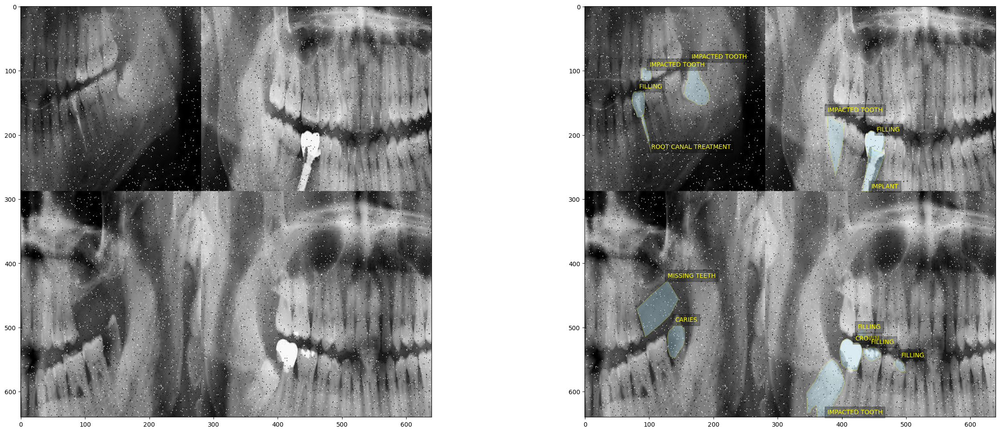

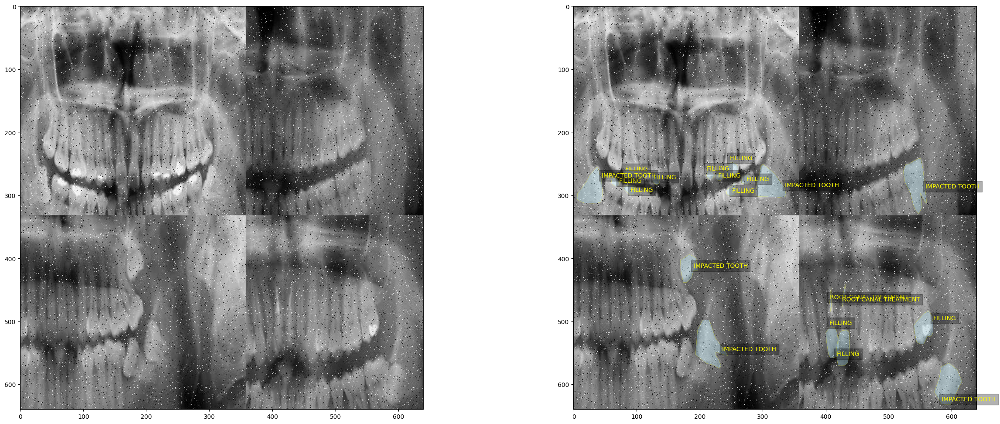

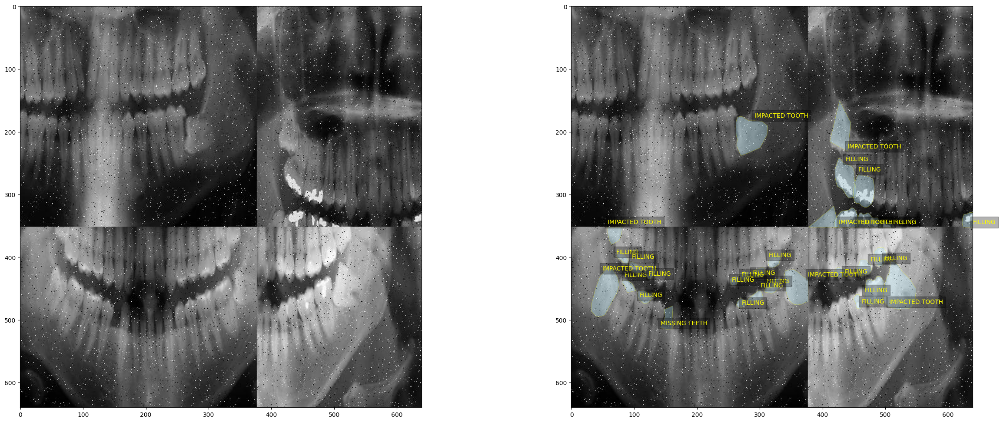

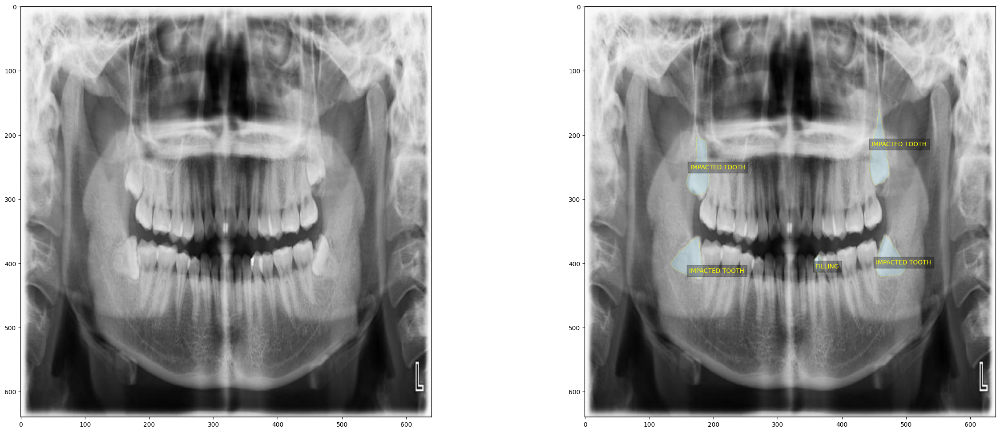

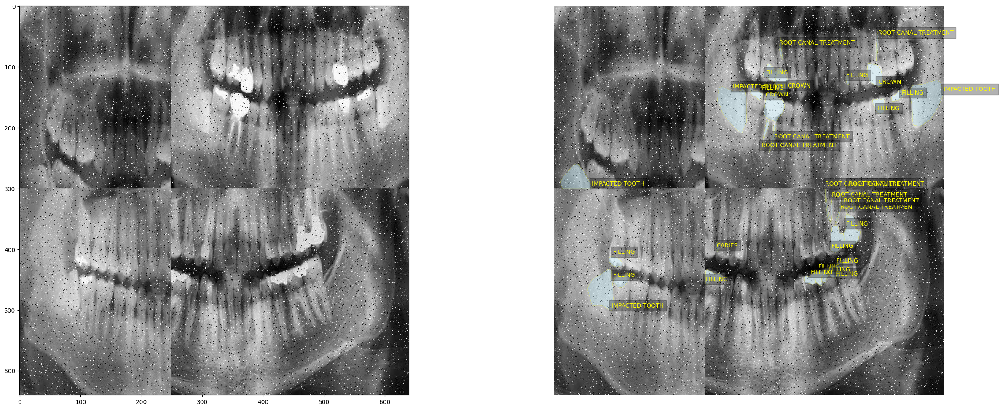

In [13]:
display_images(dataset_path)


# Model Selection

>  - MaskRCNN
>  - Yolov5
>  - Custom Model



# Model Pipeline

In [7]:
import torch

In [8]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [16]:
# Create a Folder to save the runs
os.mkdir('Runs')

In [17]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17003, done.
remote: Counting objects: 100% (198/198), done.
remote: Compressing objects: 100% (144/144), done.
remote: Total 17003 (delta 107), reused 114 (delta 54), pack-reused 16805 (from 1)
Receiving objects: 100% (17003/17003), 15.72 MiB | 26.40 MiB/s, done.
Resolving deltas: 100% (11645/11645), done.


In [10]:
%cd yolov5

/kaggle/working/yolov5


In [11]:
!pip install -r requirements.txt -q

In [12]:
# Turn off WandDB

import utils

display = utils.notebook_init()

YOLOv5 🚀 v7.0-376-gbcd88eaf Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)


Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5933.9/8062.4 GB disk)


Config Training

In [13]:
base_model = 'yolov5s.pt'
BATCH_SIZE = 32
EPOCHS = 50
IMG_SIZE = 640
PROJECT_PATH = '/kaggle/working/Runs'

data_yaml = '/kaggle/working/cdata.yaml'
testing_path = '/kaggle/input/dental-diseases/test/images'

In [ ]:
!python -W ignore segment/train.py --data $data_yaml --weights $base_model --imgsz $IMG_SIZE --batch-size $BATCH_SIZE --epochs $EPOCHS --device 0 --project $PROJECT_PATH

segment/train: weights=/kaggle/working/Runs/exp2/weights/last.pt, cfg=, data=/kaggle/working/cdata.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=/kaggle/working/Runs, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, mask_ratio=4, no_overlap=False
github: ⚠️ YOLOv5 is out of date by 2 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
YOLOv5 🚀 v7.0-376-gbcd88eaf Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1

In [42]:
def visualize_metrics(file_path, train=True):
    """
    Visualizes precision, recall, F1 score, and mAP metrics from YOLOv5 results.csv.

    Parameters:
        file_path (str): Path to the results.csv file.
    """
   
    data = pd.read_csv(file_path)
    data.columns = data.columns.str.strip()
   
    # Check if necessary columns exist
    required_columns = [
        'epoch',
        'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP_0.5(B)', 
        'metrics/mAP_0.5:0.95(B)', 'metrics/precision(M)', 'metrics/recall(M)', 
        'metrics/mAP_0.5(M)', 'metrics/mAP_0.5:0.95(M)'
    ]
    # Set up plot aesthetics
    sns.set_theme(style="whitegrid")
    metrics = {
        "Precision (Box)": "metrics/precision(B)",
        "Recall (Box)": "metrics/recall(B)",
        "mAP@0.5 (Box)": "metrics/mAP_0.5(B)",
        "mAP@0.5:0.95 (Box)": "metrics/mAP_0.5:0.95(B)",
        "Precision (Mask)": "metrics/precision(M)",
        "Recall (Mask)": "metrics/recall(M)",
        "mAP@0.5 (Mask)": "metrics/mAP_0.5(M)",
        "mAP@0.5:0.95 (Mask)": "metrics/mAP_0.5:0.95(M)"
    }
    
    # Plot metrics
    perform = "Training"
    fig, axes = plt.subplots(4, 2, figsize=(16, 16), constrained_layout=True)
    fig.suptitle(f"Model's {perform} Metrics", fontsize=18, fontweight="bold")

    for idx, (metric_name, column) in enumerate(metrics.items()):
        ax = axes[idx // 2, idx % 2]
        ax.plot(data['epoch'], data[column], label=metric_name, color=sns.color_palette()[idx % len(sns.color_palette())], linewidth=2)
        ax.set_title(metric_name, fontsize=14)
        ax.set_xlabel("Epochs", fontsize=12)
        ax.set_ylabel(metric_name.split()[0], fontsize=12)
        ax.legend()

    plt.show()

In [17]:
!python -W ignore segment/val.py --data $data_yaml --weights /kaggle/working/Runs/exp3/weights/best.pt --imgsz $IMG_SIZE --device 0

segment/val: data=/kaggle/working/cdata.yaml, weights=['/kaggle/working/Runs/exp3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val-seg, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-376-gbcd88eaf Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

Fusing layers... 
Model summary: 165 layers, 7428089 parameters, 0 gradients, 25.8 GFLOPs
val: Scanning /kaggle/input/dental-diseases/valid/labels... 1953 images, 0 backg
val: WARNING ⚠️ Cache directory /kaggle/input/dental-diseases/valid is not writeable: [Errno 30] Read-only file system: '/kaggle/input/dental-diseases/valid/labels.cache.npy'
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       1953      18170      0.778      0.563      0.588      0.3

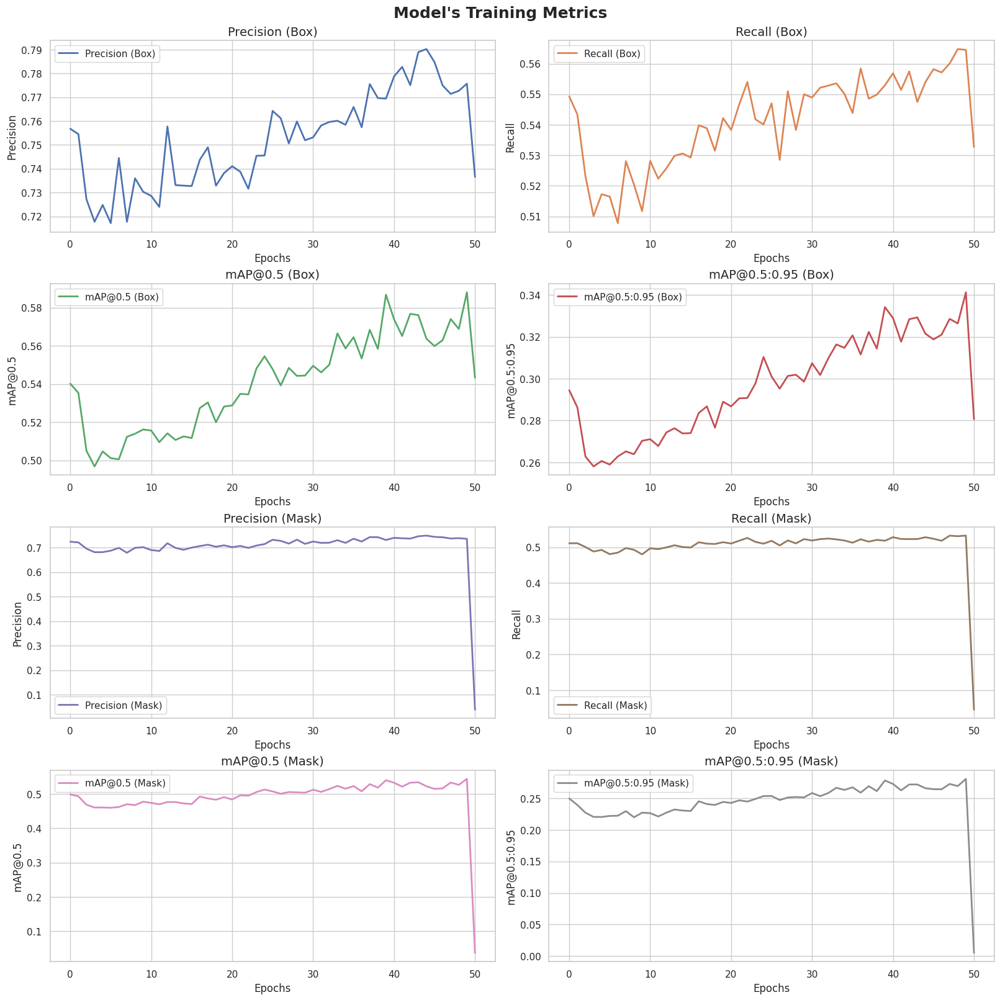

In [43]:
visualize_metrics("/kaggle/working/Runs/exp3/results.csv")

In [98]:
def display_test_images(dataset_path, predicted_labels_path, sample_size=5, class_names=None):    
    for folder in dataset_path.iterdir():
        if folder.is_file() or folder.name != 'test':
            continue
        
        true_labels = None
        
        # Iterate through the contents of the 'test' folder
        for inside in folder.iterdir():
            if inside.name == 'labels':
                true_labels = inside  # Path to true labels
                continue
            
            # Get all image files
            image_files = list(inside.iterdir())
            random_sample = random.sample(image_files, sample_size)
            
            for image_file in random_sample:
                image = cv2.imread(str(image_file.absolute()))
                true_label_path = list(true_labels.glob(f'{image_file.stem}.*'))[0]
                predicted_label_path = list(predicted_labels_path.glob(f'{image_file.stem}.*'))[0]
                
                # Load true and predicted labels
                true_labels_data = load_labels(true_label_path)
                predicted_labels_data = load_labels(predicted_label_path)
                
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                fig, ax = plt.subplots(1, 2, figsize=(30, 12))
                ax[0].imshow(image_rgb)
                ax[0].set_title('TRUE')
                ax[1].imshow(image_rgb)
                ax[1].set_title('PREDICTED')
                
                img_h, img_w = image.shape[:2]
                
                # Plot true labels (left)
                plot_labels(ax[0], true_labels_data, img_w, img_h, 'green', classes_names)
                
                # Plot predicted labels (right)
                plot_labels(ax[1], predicted_labels_data, img_w, img_h, 'red', classes_names)
                
                plt.axis('off')
                plt.tight_layout()
                plt.show()

Visual result Test

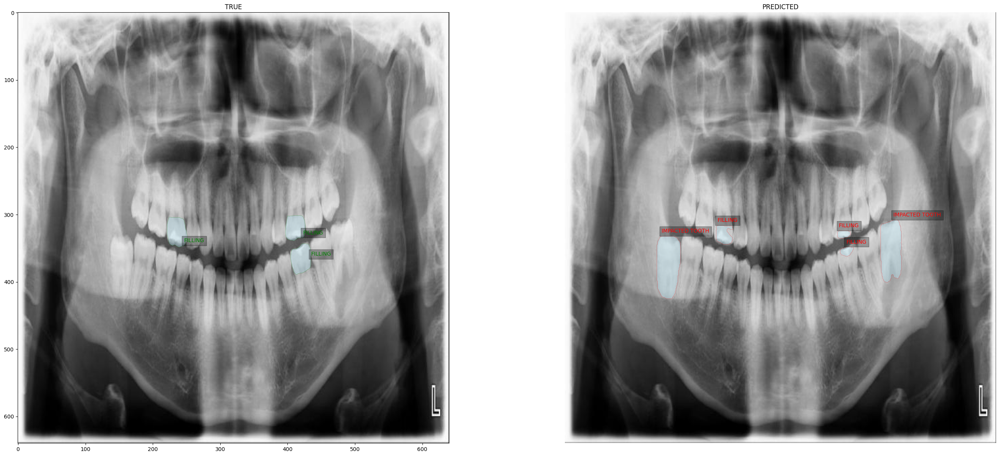

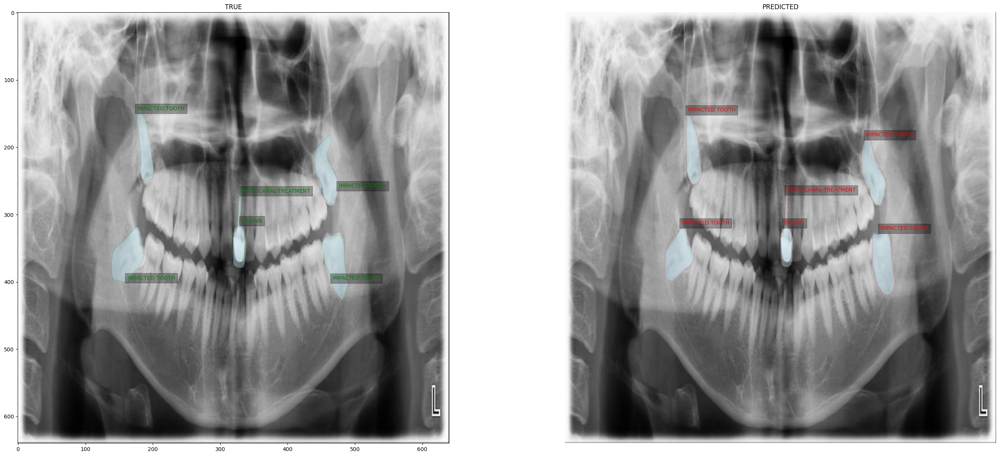

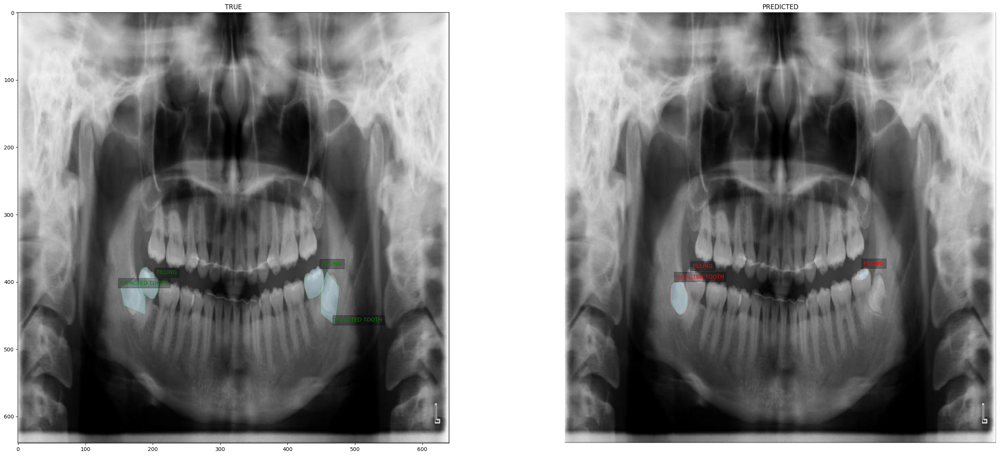

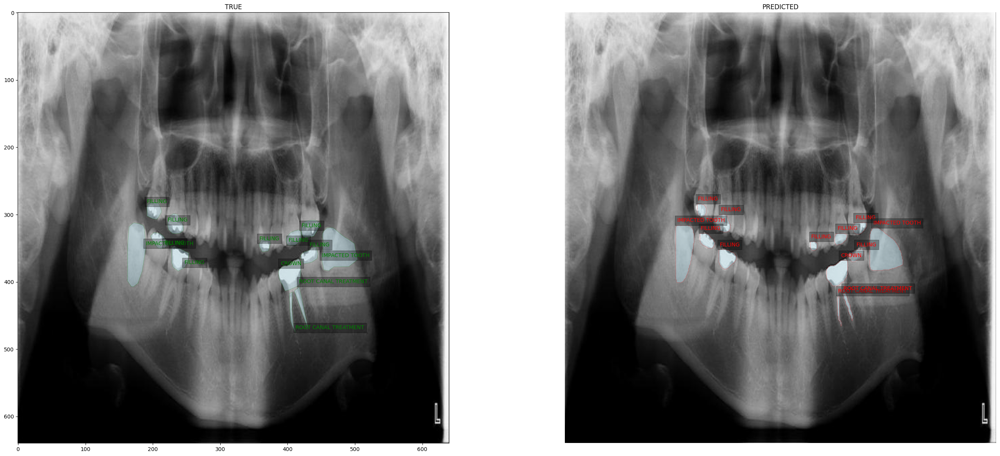

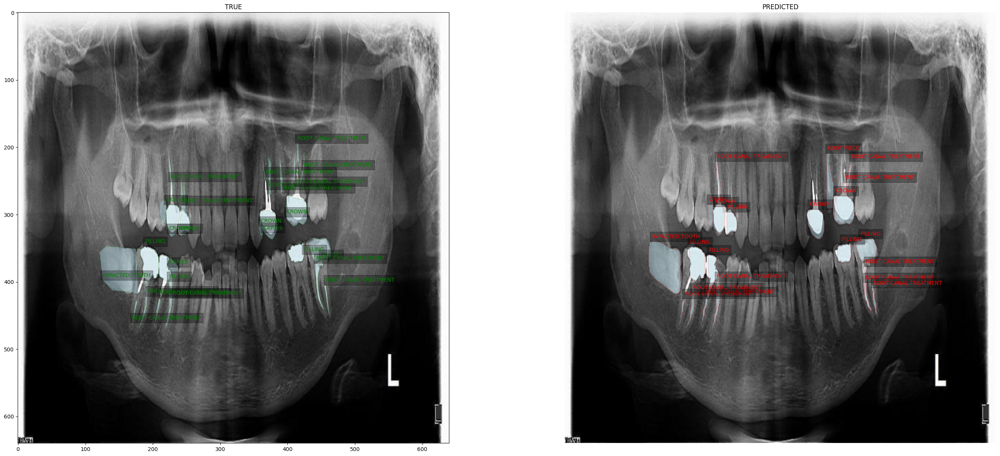

In [99]:
testing_predicted_labels = pathlib.Path('/kaggle/working/Runs/predictions2/labels')

display_test_images(dataset_path, testing_predicted_labels)